# Assignment 1 - Single View Geometry Part A

Team Ironix:
<br>
Iva Ilcheva - ilchei@usi.ch<br>
Reinard Lazuardi Kuwandy - kuwanr@usi.ch

In [1]:
import time
import numpy as np
from numpy import cross
from numpy.linalg import svd
import matplotlib
from PIL import Image
import math
matplotlib.use('TkAgg')
import matplotlib.pyplot as plt

In [2]:
from utils import select_points, draw_line, imwarpLinear, bilinear_interpolate, create_A, homographyEstimation

In [3]:
import pprint
pp = pprint.PrettyPrinter()

## All picked points from image S ##

#### Load image S

In [4]:
%matplotlib inline
imgS = plt.imread("S.png")

In [5]:
# points to estimate the homography
[a,b,c,d] = [[212.20275565, 590.55690218,   1.        ],
             [936.74500457, 592.06010187,   1.        ],
             [213.70595533, 187.69938618,   1.        ],
             [936.74500457, 189.20258587,   1.        ]]

# stadium outline
[e,f,g,h] = [[  50.42323735,  729.77829205, 1.],
                 [1100.576909,    729.77829205, 1.],
                 [  50.42323735,   48.24999085, 1.],
                 [1099.1481285,   48.24999085, 1.]]

# left football door
[i,j,k,l,m,n,o,p] = [[ 50.09470461, 591.06374987, 1.],
                     [213.88767831, 594.21361475, 1.],
                     [ 50.09470461, 189.45597783, 1.],
                     [213.88767831, 189.45597783, 1.],
                     [ 50.09470461, 482.39341156, 1.],
                     [103.64240755, 482.39341156, 1.],
                     [ 50.09470461, 299.70124859, 1.],
                     [103.64240755, 299.70124859, 1.]]

# right football door
[q,r,s,t,u,v,w,x_] = [[ 935.73926665,  189.26663793, 1.],
                     [1102.11396413,  187.74026456, 1.],
                     [ 937.26564002,  592.22920797, 1.],
                     [1102.11396413,  592.22920797, 1.],
                     [1045.63814939,  299.16552067, 1.],
                     [1100.58759076,  299.16552067, 1.],
                     [1045.63814939,  480.80395186, 1.],
                     [1100.58759076,  480.80395186, 1.]]

# field center
[center, y, z] = [[574.97273933, 389.83643598, 1.],
                  [573.94432016, 729.41394121, 1.],
                  [573.94432016,  49.6591204, 1. ]]

x = [a,b,c,d]
stadium_outline = [e,f,g,h]
left_football_door = [i,j,k,l,m,n,o,p]
right_football_door = [q,r,s,t,u,v,w,x_]
field_center = [center, y, z]

## Points from image I to estimate the homography ##

#### Load image I

In [6]:
%matplotlib inline
imgI = plt.imread("I.png")

In [7]:
[aP, bP, cP, dP]= [[102.36613465, 527.33724851,   1.        ],
                    [512.39198606, 707.17314825,   1.        ],
                    [453.40581095, 464.0350118 ,   1.        ],
                     [965.57845341, 548.91755648,   1.        ]]
xP = [aP, bP, cP, dP]

print("correspondent points in image I, xP : ")
pp.pprint(xP)

correspondent points in image I, xP : 
[[102.36613465, 527.33724851, 1.0],
 [512.39198606, 707.17314825, 1.0],
 [453.40581095, 464.0350118, 1.0],
 [965.57845341, 548.91755648, 1.0]]


## Points from image J to estimate the homography ##

In [8]:
%matplotlib inline
imgJ = plt.imread("J.jpg")

In [9]:
[J_aP,J_bP,J_cP,J_dP] = [[457.33789333, 396.09565731, 1.],
 [658.14893999, 445.37444176,1.],
 [716.05151173, 238.40354705,1.],
 [878.67150044, 265.5068785, 1.]]

J_xP = [J_aP,J_bP,J_cP,J_dP]

print("correspondent points in image J, J_xP : ")
pp.pprint(J_xP)

correspondent points in image J, J_xP : 
[[457.33789333, 396.09565731, 1.0],
 [658.14893999, 445.37444176, 1.0],
 [716.05151173, 238.40354705, 1.0],
 [878.67150044, 265.5068785, 1.0]]


## Points used to estimate the homography ##

#### Image S ####

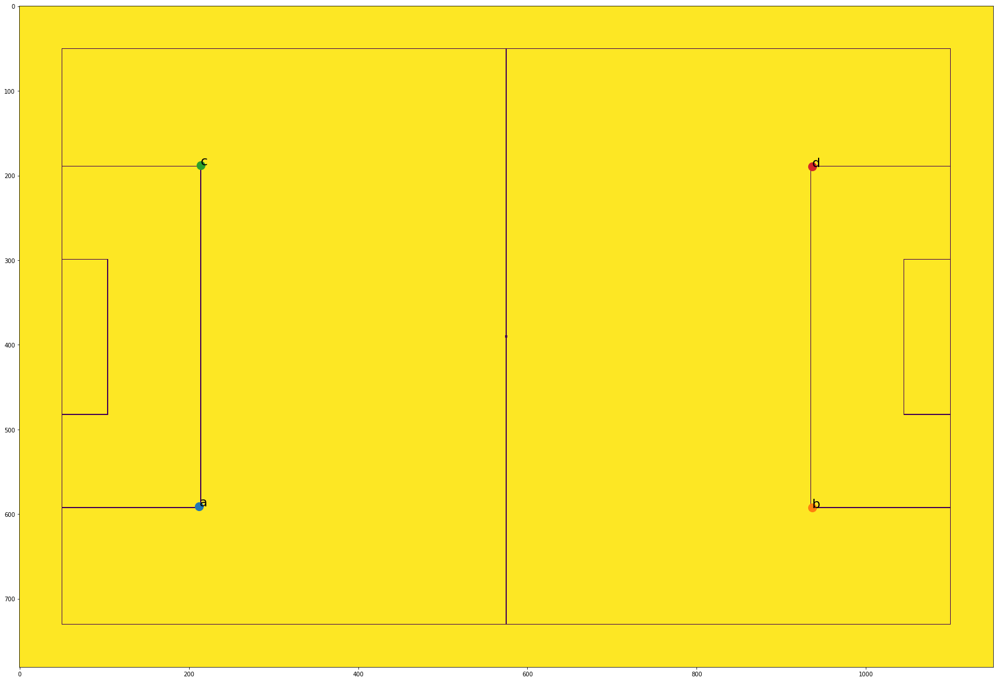

In [10]:
%matplotlib inline

plt.subplots(1, 1, figsize = (30, 30))
plt.rcParams.update({'font.size': 22})
plt.imshow(imgS)
plt.scatter(a[0],a[1], s = 200)
plt.annotate('a',(a[:2]) )
plt.scatter(b[0],b[1], s = 200)
plt.annotate('b', b[:2])
plt.scatter(c[0],c[1], s = 200)
plt.annotate('c', c[:2])
plt.scatter(d[0],d[1], s = 200)
plt.annotate('d', d[:2])

plt.show()

#### Image I ####

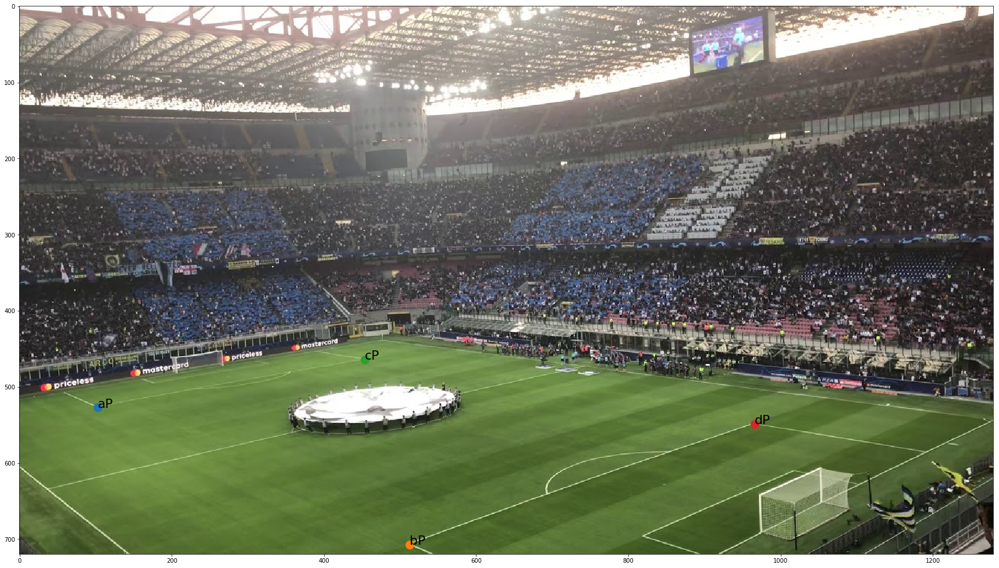

In [11]:
%matplotlib inline

plt.subplots(1, 1, figsize = (30, 30))
plt.rcParams.update({'font.size': 22})
plt.imshow(imgI)
plt.scatter(aP[0],aP[1], s = 200)
plt.annotate('aP',(aP[:2]) )
plt.scatter(bP[0],bP[1], s = 200)
plt.annotate('bP', bP[:2])
plt.scatter(cP[0],cP[1], s = 200)
plt.annotate('cP', cP[:2])
plt.scatter(dP[0],dP[1], s = 200)
plt.annotate('dP', dP[:2])

plt.show()

#### Image J ####

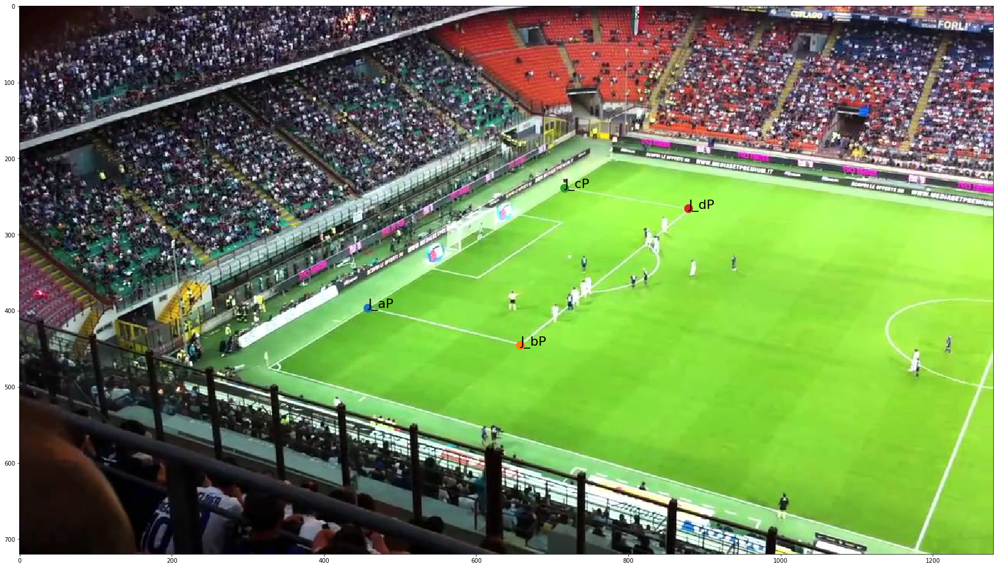

In [12]:
%matplotlib inline

plt.subplots(1, 1, figsize = (30, 30))
plt.rcParams.update({'font.size': 22})
plt.imshow(imgJ)
plt.scatter(J_aP[0],J_aP[1], s=200)
plt.annotate('J_aP',(J_aP[:2]) )
plt.scatter(J_bP[0],J_bP[1], s=200)
plt.annotate('J_bP', J_bP[:2])
plt.scatter(J_cP[0],J_cP[1], s=200)
plt.annotate('J_cP', J_cP[:2])
plt.scatter(J_dP[0],J_dP[1], s=200)
plt.annotate('J_dP', J_dP[:2])

plt.show()

#### NB: In Single_View_Geometry_B and Single_View_Geometry_C, the next two functions are imported from utils.py ####

# Function to construct the matrix A #

In [13]:
def create_A(x, xP):
    '''creating matrix A for calculatin homography estimation
        Input : x  = correspondent points in first image
                xP = correspondent points in second image
        Output: A = matrix A
    '''
    
    A = np.array([
        np.hstack((np.array([0, 0, 0]), -xP[0][2]*np.transpose(x[0]), xP[0][1]*np.transpose(x[0]))),
        np.hstack((xP[0][2]*np.transpose(x[0]), np.array([0, 0, 0]), -xP[0][0]*np.transpose(x[0]))),
        
        np.hstack((np.array([0, 0, 0]), -xP[1][2]*np.transpose(x[1]), xP[1][1]*np.transpose(x[1]))),
        np.hstack((xP[1][2]*np.transpose(x[1]), np.array([0, 0, 0]), -xP[1][0]*np.transpose(x[1]))),
        
        np.hstack((np.array([0, 0, 0]), -xP[2][2]*np.transpose(x[2]), xP[2][1]*np.transpose(x[2]))),
        np.hstack((xP[2][2]*np.transpose(x[2]), np.array([0, 0, 0]), -xP[2][0]*np.transpose(x[2]))),
        
        np.hstack((np.array([0, 0, 0]), -xP[3][2]*np.transpose(x[3]), xP[3][1]*np.transpose(x[3]))),
        np.hstack((xP[3][2]*np.transpose(x[3]), np.array([0, 0, 0]), -xP[3][0]*np.transpose(x[3])))
        ])
        
        
    return A

# Defining the homography estimation using the SVD </br> and the corresponding 4 points </br> x = [a,b,c,d] & xP = [aP, bP, cP, dP]#

In [14]:
from numpy.linalg import svd

def homographyEstimation(x, xP):
    '''calculate homography estimation
        Input : x  = correspondent points in first image
                xP = correspondent points in second image
        Output: H = Homography matrix
    '''
    
    A = create_A(x, xP)
    U,D,V = svd(A)
    H = (V[8]/V[8][8]).reshape((3,3))  
    
    return H


# Calculating matrix H for imgI #

In [15]:
H = homographyEstimation(x,xP)
print("H : ")
pp.pprint(H)

H : 
array([[ 1.56178264e-01, -7.63686095e-01,  4.87618104e+02],
       [-1.49605254e-01, -6.79259371e-02,  4.31225386e+02],
       [-4.50154667e-04, -3.77619433e-04,  1.00000000e+00]])


# Calculating matrix H for imgJ #

In [16]:
## Takin points on image I which correspond to image J
J_x = left_football_door[:4]
print("4 points in image I, J_x : ")
pp.pprint(J_x)
print("\n")

# Calculate homography estimation
J_H = homographyEstimation(J_x,J_xP)
print("Homography estimation of image I and J, J_H : ")
pp.pprint(J_H)

4 points in image I, J_x : 
[[50.09470461, 591.06374987, 1.0],
 [213.88767831, 594.21361475, 1.0],
 [50.09470461, 189.45597783, 1.0],
 [213.88767831, 189.45597783, 1.0]]


Homography estimation of image I and J, J_H : 
array([[ 6.52579407e-01, -8.20460827e-01,  7.55006847e+02],
       [ 7.84008685e-02,  1.28748979e-01,  1.82184915e+02],
       [-2.55013864e-04, -5.50254475e-04,  1.00000000e+00]])


### Plotting all points from Image S to be estimated for image I ###

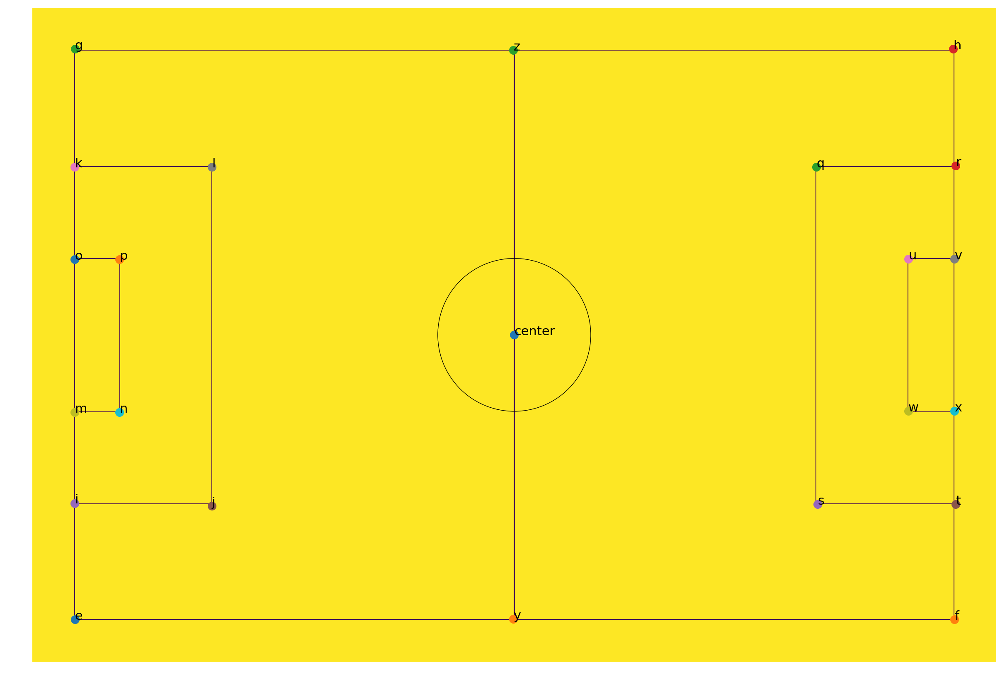

<Figure size 1151x781 with 0 Axes>

In [17]:
plt.rcParams['figure.figsize'] = [30, 30]
plt.rcParams['figure.dpi'] = 100
plt.rcParams.update({'font.size': 22})
plt.imshow(imgS)

# stadium outline
plt.scatter(e[0],e[1], s=200)
plt.annotate('e', e[:2])
plt.scatter(f[0],f[1], s=200)
plt.annotate('f', f[:2])
plt.scatter(g[0],g[1], s=200)
plt.annotate('g', g[:2])
plt.scatter(h[0],h[1], s=200)
plt.annotate('h', h[:2])

# left door
plt.scatter(i[0],i[1], s=200)
plt.annotate('i', i[:2])
plt.scatter(j[0],j[1], s=200)
plt.annotate('j', j[:2])
plt.scatter(k[0],k[1], s=200)
plt.annotate('k', k[:2])
plt.scatter(l[0],l[1], s=200)
plt.annotate('l', l[:2])
plt.scatter(m[0],m[1], s=200)
plt.annotate('m', m[:2])
plt.scatter(n[0],n[1], s=200)
plt.annotate('n', n[:2])
plt.scatter(o[0],o[1], s=200)
plt.annotate('o', o[:2])
plt.scatter(p[0],p[1], s=200)
plt.annotate('p', p[:2])

# right door
plt.scatter(q[0],q[1], s=200)
plt.annotate('q', q[:2])
plt.scatter(r[0],r[1], s=200)
plt.annotate('r', r[:2])
plt.scatter(s[0],s[1], s=200)
plt.annotate('s', s[:2])
plt.scatter(t[0],t[1], s=200)
plt.annotate('t', t[:2])
plt.scatter(u[0],u[1], s=200)
plt.annotate('u', u[:2])
plt.scatter(v[0],v[1], s=200)
plt.annotate('v', v[:2])
plt.scatter(w[0],w[1], s=200)
plt.annotate('w', w[:2])
plt.scatter(x_[0],x_[1], s=200)
plt.annotate('x', x_[:2])

# field center
plt.scatter(center[0],center[1], s=200)
plt.annotate('center', center[:2])
plt.scatter(y[0],y[1], s=200)
plt.annotate('y', y[:2])
plt.scatter(z[0],z[1], s=200)
plt.annotate('z', z[:2])

#plt.scatter(center[0], center[1], s=100)
# ra = abs(h[1]-r[1])/2
ra = abs(p[1] - n[1])/2
# on the original pitch image measurements the distance between h.y and r.y halved equaled the radius of the circle
circle= plt.Circle((center[0], center[1]), radius= ra, fill=False)
ax=plt.gca()
plt.gca().add_patch(circle)
plt.axis('off')

plt.figure(figsize=(11.51, 7.81), dpi=100)



#plt.figure().savefig('S-with-circle.png')
plt.show()



## Retrieving 5 random points that lie on the circle in the center of the field to estimate the Conic coefficients ##

/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/matplotlib/figure.py:98: MatplotlibDeprecationWarning: 
Adding an axes using the same arguments as a previous axes currently reuses the earlier instance.  In a future version, a new instance will always be created and returned.  Meanwhile, this warning can be suppressed, and the future behavior ensured, by passing a unique label to each axes instance.
  "Adding an axes using the same arguments as a previous axes "


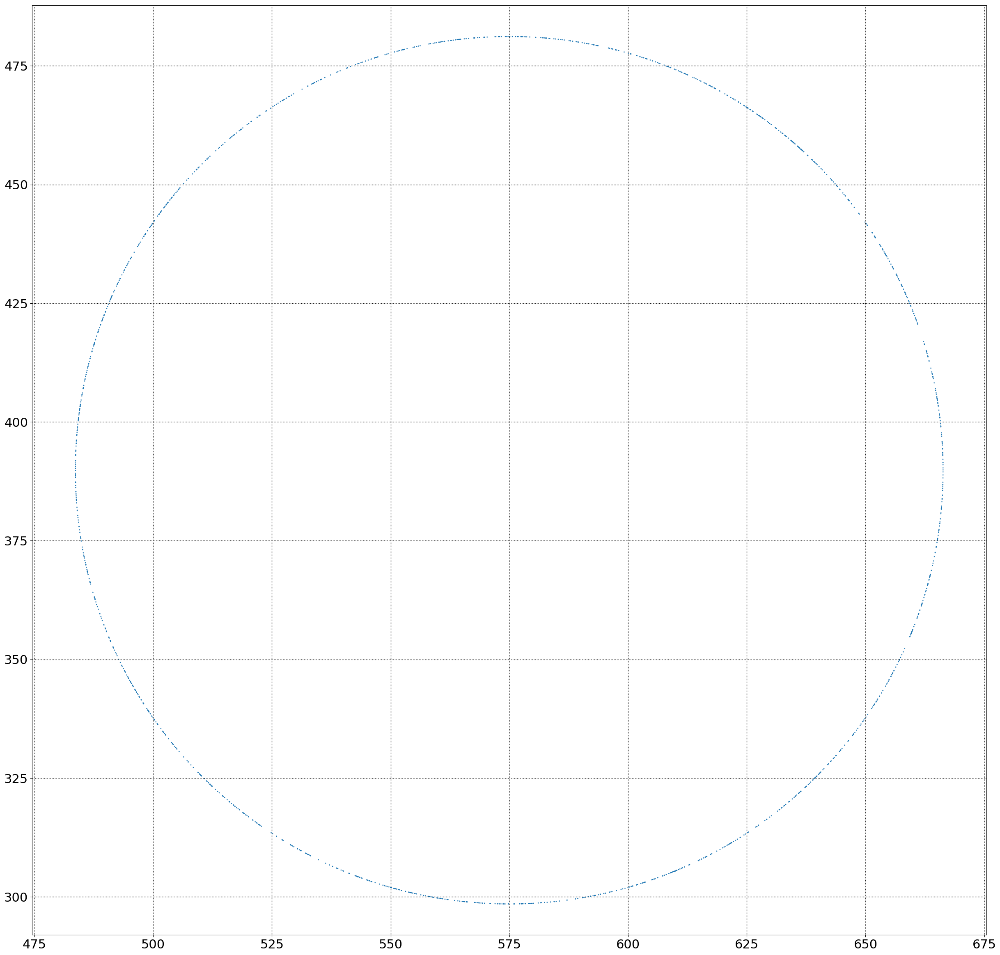

In [18]:
import matplotlib.pyplot as plt
from math import pi, cos, sin
from random import random

radius = ra

def point(h, k, r):
    theta = random() * 2 * pi
#     theta = np.linspace(0, 2*np.pi, 100)
#     print(theta)
    return [h + cos(theta) * r, k + sin(theta) * r, 1.]

# print(radius)
conicPoints = [point(center[0],center[1],radius) for _ in range(1500)]
# print(conicPoints)
plt.scatter(*zip(*conicPoints))
plt.grid(color='k', linestyle=':', linewidth=1)
plt.axes().set_aspect('equal', 'datalim')
plt.show()


## Computing the conic coefficients ##

In [19]:
from numpy.linalg import lstsq

F = 1.0
matrixP = []
for [x,y,z] in conicPoints:
    matrixP.append(np.vstack([x**2, x * y, y**2, x, y]).T)


matrixP = np.reshape(matrixP, [1500,5])
fullSolution = lstsq(matrixP, F * np.ones(len(conicPoints)))
(A, B, C, D, E) = fullSolution[0]

print("(A, B, C, D, E, F) : ")
pp.pprint((A, B, C, D, E, F))
# (A, B, C, D, E, F)

(A, B, C, D, E, F) : 
(-2.1087170535794063e-06,
 -2.5021353261892032e-18,
 -2.1087170535784106e-06,
 0.0024249096415378244,
 0.0016441094813159287,
 1.0)


/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/ipykernel_launcher.py:10: FutureWarning: `rcond` parameter will change to the default of machine precision times ``max(M, N)`` where M and N are the input matrix dimensions.
To use the future default and silence this warning we advise to pass `rcond=None`, to keep using the old, explicitly pass `rcond=-1`.
  # Remove the CWD from sys.path while we load stuff.


## Building matrix C ##

In [20]:
matrixC = [[A, B/2, D/2],
           [B/2, C, E/2],
           [D/2, E/2, F]]

print("matrixC : ")
pp.pprint(matrixC)

matrixC : 
[[-2.1087170535794063e-06, -1.2510676630946016e-18, 0.0012124548207689122],
 [-1.2510676630946016e-18, -2.1087170535784106e-06, 0.0008220547406579643],
 [0.0012124548207689122, 0.0008220547406579643, 1.0]]


## Homography estimation of the conic ##

In [21]:
from numpy.linalg import inv

Hinv = inv(H)

# 𝐶′=𝐻−𝑇𝐶𝐻−1
# C' = (H.inv).T @ (C @ H.inv)
matrixCPrime = np.dot(Hinv.T, np.dot(matrixC, Hinv))


[Ap, Bp, Cp, Dp, Ep, Fp] = [matrixCPrime[0][0],matrixCPrime[0][1]*2,matrixCPrime[1][1],matrixCPrime[0][2]*2,matrixCPrime[1][2]*2, matrixCPrime[2][2]]

print("matrixCPrime : ")
pp.pprint(matrixCPrime)
print("\n")


print("[Ap, Bp, Cp, Dp, Ep, Fp] : ")
pp.pprint([Ap, Bp, Cp, Dp, Ep, Fp])
print("\n")

matrixCPrime : 
array([[-4.88120530e-06, -3.30120747e-06,  5.50258351e-03],
       [-3.30120747e-06, -7.65396277e-06,  2.79234456e-02],
       [ 5.50258351e-03,  2.79234456e-02, -2.44766980e+01]])


[Ap, Bp, Cp, Dp, Ep, Fp] : 
[-4.881205297551974e-06,
 -6.602414935260539e-06,
 -7.653962773492037e-06,
 0.011005167027049732,
 0.05584689120332356,
 -24.476698003225838]




# Homography estimation of all points in the field for ImgI#

In [22]:

all_points = [stadium_outline, left_football_door, right_football_door, field_center, conicPoints]
all_points_prime = []
for i in all_points:
    iPrime = []
    for j in i:
        jP = H @ np.transpose(j)
        jP = jP/jP[2]
        iPrime.append(jP)
    all_points_prime.append(iPrime)
    
[stadium_outline_prime, left_football_door_prime, right_football_door_prime, field_center_prime, conic_points_prime] = all_points_prime 
[eP,fP,gP,hP] = stadium_outline_prime
[iP,jP,kP,lP,mP,nP,oP,pP] = left_football_door_prime
[qP,rP,sP,tP,uP,vP,wP,xP] = right_football_door_prime
[centerP, yP, zP] = field_center_prime
print(iP,jP)

[ 58.40834832 508.55967702   1.        ] [ 98.9650847  528.26122394   1.        ]


# Homography estimation of all points in the field for ImgJ#

In [23]:
all_points = [stadium_outline, left_football_door, right_football_door, field_center, conicPoints]
J_all_points_prime = []
for i in all_points:
    J_iPrime = []
    for j in i:
        J_P = J_H @ np.transpose(j)
        J_P = J_P/J_P[2]
        J_iPrime.append(J_P)
    J_all_points_prime.append(J_iPrime)
    
[J_stadium_outline_prime, J_left_football_door_prime, J_right_football_door_prime, J_field_center_prime, J_conic_points_prime] = J_all_points_prime 
[J_eP,J_fP,J_gP,J_hP] = J_stadium_outline_prime
[J_iP,J_jP,J_kP,J_lP,J_mP,J_nP,J_oP,J_pP] = J_left_football_door_prime
[J_qP,J_rP,J_sP,J_tP,J_uP,J_vP,J_wP,J_xP] = J_right_football_door_prime
[J_centerP, J_yP, J_zP] = J_field_center_prime

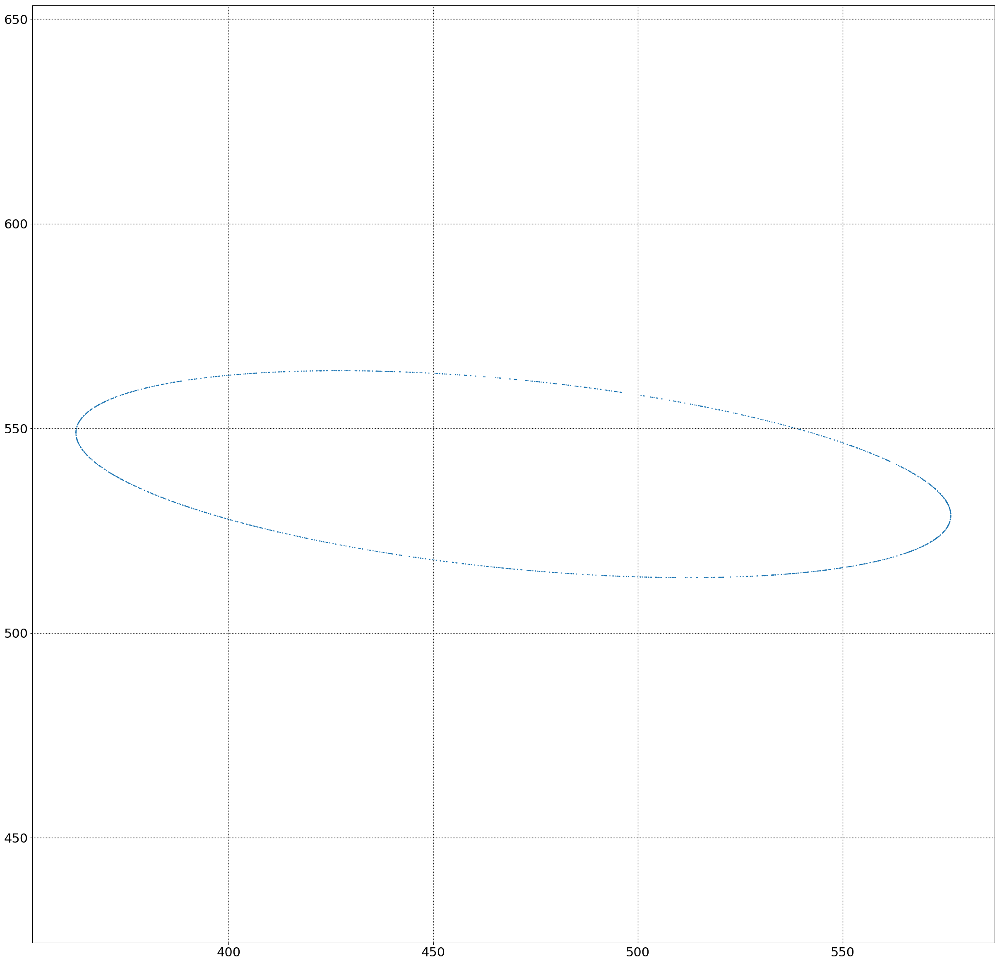

In [24]:
## show conic points in image I
plt.scatter(*zip(*conic_points_prime))
plt.grid(color='k', linestyle=':', linewidth=1)
plt.axes().set_aspect('equal', 'datalim')
plt.show()

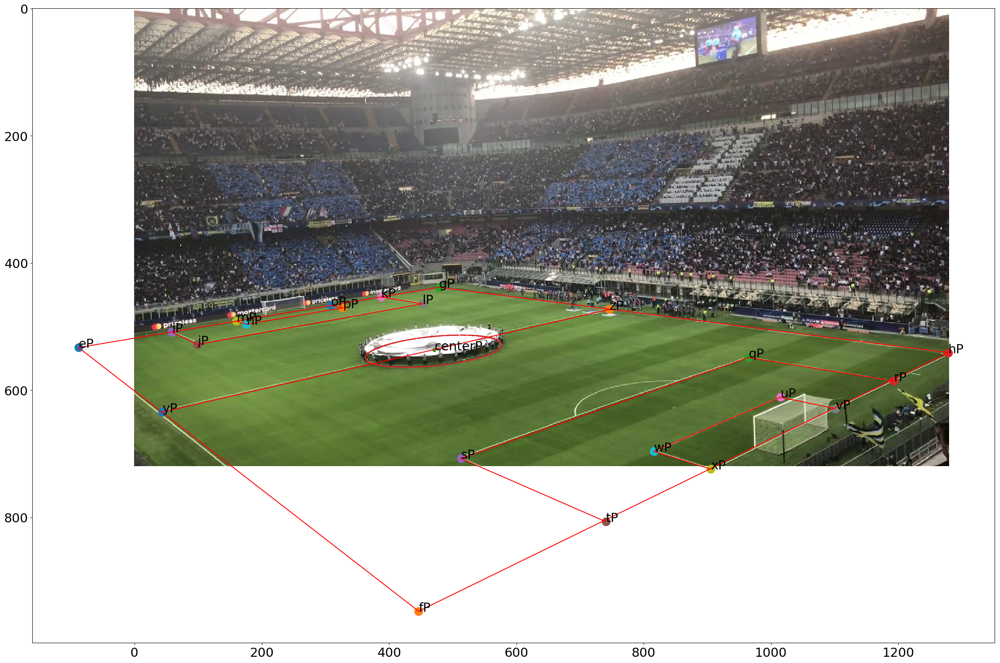

In [25]:
plt.rcParams['figure.figsize'] = [30, 30]
plt.rcParams['figure.dpi'] = 100
plt.rcParams.update({'font.size': 22})
plt.imshow(imgI)


# stadium outline
plt.scatter(eP[0],eP[1], s=200)
plt.annotate('eP', eP[:2])
plt.scatter(fP[0],fP[1], s=200)
plt.annotate('fP', fP[:2])
plt.scatter(gP[0],gP[1], s=200)
plt.annotate('gP', gP[:2])
plt.scatter(hP[0],hP[1], s=200)
plt.annotate('hP', hP[:2])
draw_line(eP,fP, 'r')
draw_line(eP,gP, 'r')
draw_line(fP,hP, 'r')
draw_line(gP,hP, 'r')


# left door
plt.scatter(iP[0],iP[1], s=200)
plt.annotate('iP', iP[:2])
plt.scatter(jP[0],jP[1], s=200)
plt.annotate('jP', jP[:2])
plt.scatter(kP[0],kP[1], s=200)
plt.annotate('kP', kP[:2])
plt.scatter(lP[0],lP[1], s=200)
plt.annotate('lP', lP[:2])
plt.scatter(mP[0],mP[1], s=200)
plt.annotate('mP', mP[:2])
plt.scatter(nP[0],nP[1], s=200)
plt.annotate('nP', nP[:2])
plt.scatter(oP[0],oP[1], s=200)
plt.annotate('oP', oP[:2])
plt.scatter(pP[0],pP[1], s=200)
plt.annotate('pP', pP[:2])
draw_line(kP,lP, 'r')
draw_line(lP,jP, 'r')
draw_line(iP,jP, 'r')
draw_line(oP,pP, 'r')
draw_line(mP,nP, 'r')
draw_line(pP,nP, 'r')

# right door
plt.scatter(qP[0],qP[1], s=200)
plt.annotate('qP', qP[:2])
plt.scatter(rP[0],rP[1], s=200)
plt.annotate('rP', rP[:2])
plt.scatter(sP[0],sP[1], s=200)
plt.annotate('sP', sP[:2])
plt.scatter(tP[0],tP[1], s=200)
plt.annotate('tP', tP[:2])
plt.scatter(uP[0],uP[1], s=200)
plt.annotate('uP', uP[:2])
plt.scatter(vP[0],vP[1], s=200)
plt.annotate('vP', vP[:2])
plt.scatter(xP[0],xP[1], s=200)
plt.annotate('xP', xP[:2])
plt.scatter(wP[0],wP[1], s=200)
plt.annotate('wP', wP[:2])
draw_line(qP,rP, 'r')
draw_line(sP,tP, 'r')
draw_line(qP,sP, 'r')
draw_line(uP,vP, 'r')
draw_line(wP,xP, 'r')
draw_line(uP,wP, 'r')

# field center
plt.annotate('yP', yP[:2])
plt.scatter(yP[0],yP[1], s=200)
plt.annotate('zP', zP[:2])
plt.scatter(zP[0],zP[1], s=200)
plt.annotate('centerP', centerP[:2])
plt.scatter(centerP[0],centerP[1])
draw_line(yP,zP, 'r')

plt.scatter(*zip(*conic_points_prime))

plt.show()

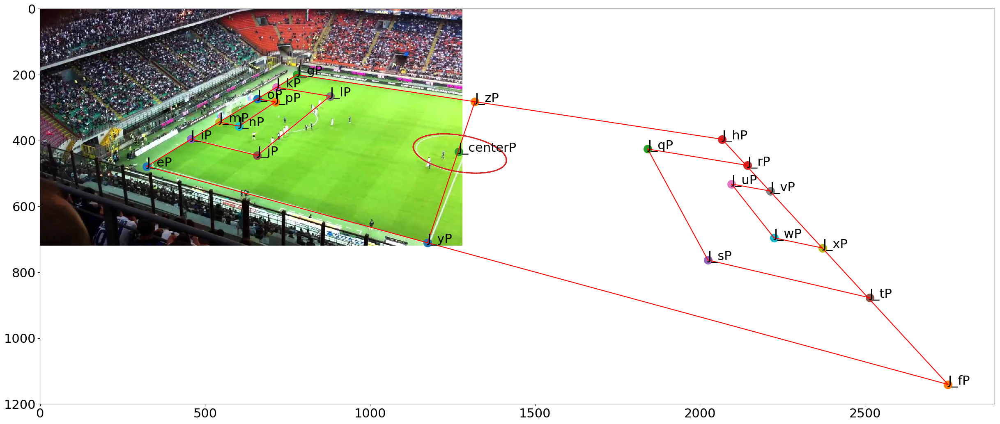

In [26]:
plt.rcParams['figure.figsize'] = [30, 30]
plt.rcParams['figure.dpi'] = 100
plt.rcParams.update({'font.size': 22})
plt.imshow(imgJ)

# stadium outline
plt.scatter(J_eP[0],J_eP[1], s=200)
plt.annotate('J_eP', J_eP[:2])
plt.scatter(J_fP[0],J_fP[1], s=200)
plt.annotate('J_fP', J_fP[:2])
plt.scatter(J_gP[0],J_gP[1], s=200)
plt.annotate('J_gP', J_gP[:2])
plt.scatter(J_hP[0],J_hP[1], s=200)
plt.annotate('J_hP', J_hP[:2])
draw_line(J_eP,J_fP, 'r')
draw_line(J_eP,J_gP, 'r')
draw_line(J_fP,J_hP, 'r')
draw_line(J_gP,J_hP, 'r')


# left door
plt.scatter(J_iP[0],J_iP[1], s=200)
plt.annotate('J_iP', J_iP[:2])
plt.scatter(J_jP[0],J_jP[1], s=200)
plt.annotate('J_jP', J_jP[:2])
plt.scatter(J_kP[0],J_kP[1], s=200)
plt.annotate('J_kP', J_kP[:2])
plt.scatter(J_lP[0],J_lP[1], s=200)
plt.annotate('J_lP', J_lP[:2])
plt.scatter(J_mP[0],J_mP[1], s=200)
plt.annotate('J_mP', J_mP[:2])
plt.scatter(J_nP[0],J_nP[1], s=200)
plt.annotate('J_nP', J_nP[:2])
plt.scatter(J_oP[0],J_oP[1], s=200)
plt.annotate('J_oP', J_oP[:2])
plt.scatter(J_pP[0],J_pP[1], s=200)
plt.annotate('J_pP', J_pP[:2])
draw_line(J_kP,J_lP, 'r')
draw_line(J_lP,J_jP, 'r')
draw_line(J_iP,J_jP, 'r')
draw_line(J_oP,J_pP, 'r')
draw_line(J_mP,J_nP, 'r')
draw_line(J_pP,J_nP, 'r')

# right door
plt.scatter(J_qP[0],J_qP[1], s=200)
plt.annotate('J_qP', J_qP[:2])
plt.scatter(J_rP[0],J_rP[1], s=200)
plt.annotate('J_rP', J_rP[:2])
plt.scatter(J_sP[0],J_sP[1], s=200)
plt.annotate('J_sP', J_sP[:2])
plt.scatter(J_tP[0],J_tP[1], s=200)
plt.annotate('J_tP', J_tP[:2])
plt.scatter(J_uP[0],J_uP[1], s=200)
plt.annotate('J_uP', J_uP[:2])
plt.scatter(J_vP[0],J_vP[1], s=200)
plt.annotate('J_vP', J_vP[:2])
plt.scatter(J_xP[0],J_xP[1], s=200)
plt.annotate('J_xP', J_xP[:2])
plt.scatter(J_wP[0],J_wP[1], s=200)
plt.annotate('J_wP', J_wP[:2])
draw_line(J_qP,J_rP, 'r')
draw_line(J_sP,J_tP, 'r')
draw_line(J_qP,J_sP, 'r')
draw_line(J_uP,J_vP, 'r')
draw_line(J_wP,J_xP, 'r')
draw_line(J_uP,J_wP, 'r')

# field center
plt.annotate('J_yP', J_yP[:2])
plt.scatter(J_yP[0],J_yP[1], s=200)
plt.annotate('J_zP', J_zP[:2])
plt.scatter(J_zP[0],J_zP[1], s=200)
plt.annotate('J_centerP', J_centerP[:2])
plt.scatter(J_centerP[0],J_centerP[1], s=200)
draw_line(J_yP,J_zP, 'r')

# field center
plt.scatter(*zip(*J_conic_points_prime))
# plt.annotate('J_A', J_conic_points_prime[0][:2])
# plt.scatter(J_conic_points_prime[0][0],J_conic_points_prime[0][1])
# plt.annotate('J_B', J_conic_points_prime[1][:2])
# plt.scatter(J_conic_points_prime[1][0],J_conic_points_prime[1][1])
# plt.annotate('J_C', J_conic_points_prime[2][:2])
# plt.scatter(J_conic_points_prime[2][0],J_conic_points_prime[2][1])
# plt.annotate('J_D', J_conic_points_prime[3][:2])
# plt.scatter(J_conic_points_prime[3][0],J_conic_points_prime[3][1])
# plt.annotate('J_E', J_conic_points_prime[4][:2])
# plt.scatter(J_conic_points_prime[4][0],J_conic_points_prime[4][1])
#draw_line(yP,zP, 'r')


plt.show()

# BONUS QUESTION #

# Picking the 4 points that lie on the conic topmost, bottommost, leftmost, rightmost and finding the tangent lines through them#

In [27]:
point1 = [371.45628678, 556.7838786, 1.]
point2 = [571.56265333, 509.84534818, 1.]
point3 = [533.6595232, 548.19504433, 1.]
point4 = [409.16079247, 508.46140687, 1.]
point5 = [575, 529, 1]
point6 = [360, 533, 1]
point7 = [455, 560, 1]
point8 = [507, 500, 1]

# Parallel lines
l1 = np.dot(matrixCPrime,point1)
l2 = np.dot(matrixCPrime,point2)

l3 = np.dot(matrixCPrime,point3)
l4 = np.dot(matrixCPrime,point4)

l5 = np.dot(matrixCPrime,point5)
l6 = np.dot(matrixCPrime,point6)

l7 = np.dot(matrixCPrime,point7)
l8 = np.dot(matrixCPrime,point8)

# Vanishing points
p1 = cross(l1,l2)
p2 = cross(l3,l4)
p3 = cross(l5,l6)
p4 = cross(l7,l8)

p1 = p1/p1[2]
p2 = p2/p2[2]
p3 = p3/p3[2]
p4 = p4/p4[2]

print("l2 : ")
pp.pprint(l2)

l2 : 
array([ 1.02956359e-03,  2.21342614e-02, -7.09498792e+00])


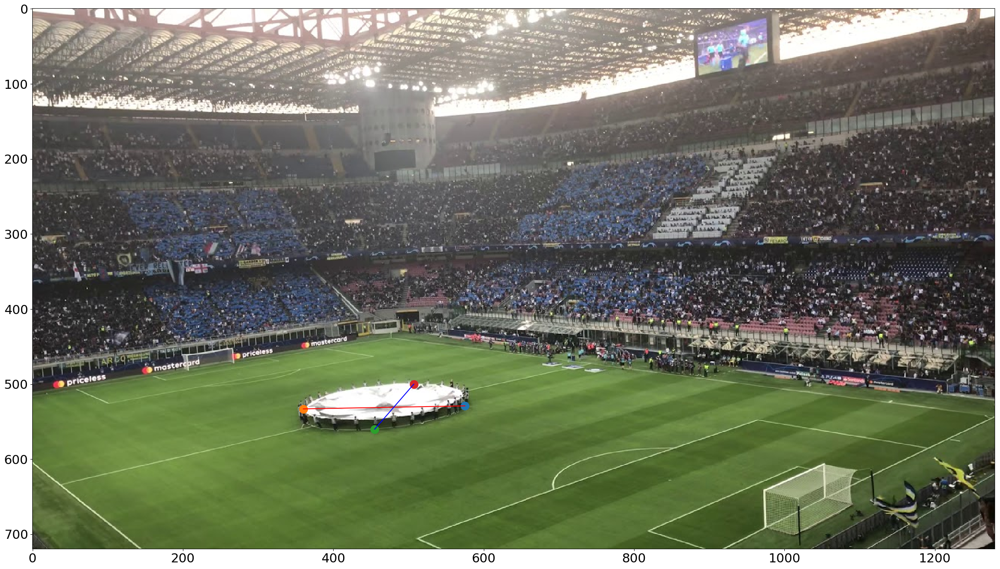

In [28]:
plt.rcParams['figure.figsize'] = [30, 30]
plt.rcParams['figure.dpi'] = 100
plt.rcParams.update({'font.size': 22})
plt.imshow(imgI)

# draw_line(point1, point2, 'r')
# draw_line(point3, point4)
# plt.scatter(point1[0], point1[1], s=200)
# plt.scatter(point2[0], point2[1], s=200)
# plt.scatter(point3[0], point3[1], s=200)
# plt.scatter(point4[0], point4[1], s=200)

draw_line(point5, point6, 'r')
draw_line(point7, point8)
plt.scatter(point5[0], point5[1], s=200)
plt.scatter(point6[0], point6[1], s=200)
plt.scatter(point7[0], point7[1], s=200)
plt.scatter(point8[0], point8[1], s=200)

plt.show()

# Computing the horizon line #

In [29]:
horz = cross(p4,p3)
horz = horz/horz[2]

print("horz : ")
pp.pprint(horz)

horz : 
array([-2.00457699e-04, -3.17633183e-03,  1.00000000e+00])


# Sending the horizon to [0,0,1] and estimating the homography #

In [30]:
H_2 = np.matrix([[1,0,0],[0,1,0],[horz[0],horz[1],horz[2]]])

if np.linalg.det(H_2) < 0:
    H_2 = np.matrix([[1,0,0],[0,1,0],[-horz[0],-horz[1],1]])
    
print("H_2 : ")
pp.pprint(H_2)

H_2 : 
matrix([[ 1.00000000e+00,  0.00000000e+00,  0.00000000e+00],
        [ 0.00000000e+00,  1.00000000e+00,  0.00000000e+00],
        [-2.00457699e-04, -3.17633183e-03,  1.00000000e+00]])


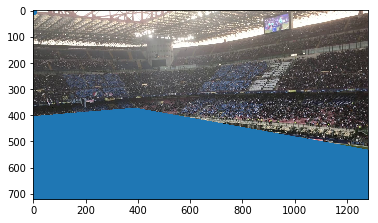

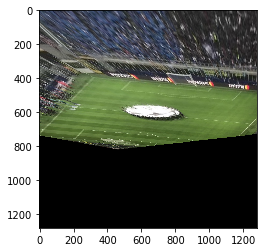

In [32]:
%matplotlib inline
imgIjpg = plt.imread("I.jpg")
J = imwarpLinear(imgIjpg, H_2, [-1300, -1300, 0, 0], step = 1280)
plt.imshow(J)